

<Body>   
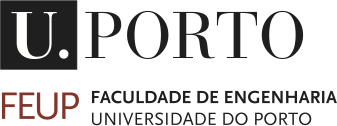   
<h1> <b>VCOMP - Assignment 2  - 2024/2025 </b> </h1>

</Body>  

###António Lopes - up202006725
###Joana Silva - up202006241

Faz no terminal uma vez na primeira vez que correres

pip install torch

pip install torch_snippets

pip install torchvision

pip install scikit-learn

In [1]:
#Import the relevant packages:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
from torch_snippets import *
import torchvision
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
import cv2
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import shutil

In [2]:
# Define your execution device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("The model will be running on", device, "device")

The model will be running on cuda:0 device


### Download só no colab aqui ja tem o data set na pasta

### UNZIP

In [32]:
# Get the current working directory (where the script is running)
folder_path = os.getcwd()

# Create a directory to store extracted files
output_folder = os.path.join(folder_path, "dataset")
os.makedirs(output_folder, exist_ok=True)

# Iterate over all files in the folder
for filename in os.listdir(folder_path):
    # Check if the file is a .zip file
    if filename.endswith('.zip'):
        zip_path = os.path.join(folder_path, filename)
        print(f"Processing: {filename}")
        
        # Open and extract the zip file
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            # Extract directly into the output folder
            zip_ref.extractall(output_folder)
            print(f"Extracted {filename} into {output_folder}")

print(f"All .zip files in {folder_path} have been processed.")

Processing: fifish_durius_2023-09-27_1.zip
Extracted fifish_durius_2023-09-27_1.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Processing: kame_durius_2023_10_12.zip
Extracted kame_durius_2023_10_12.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Processing: fifish_durius_2023-09-27_3.zip
Extracted fifish_durius_2023-09-27_3.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Processing: kame_durius_2023_07_05.zip
Extracted kame_durius_2023_07_05.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Processing: kame_cras_pool_2023-09-18.zip
Extracted kame_cras_pool_2023-09-18.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Processing: kame_durius_2023_09_26.zip
Extracted kame_durius_2023_09_26.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Processing: sample.zip
Extracted sample.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Processing: kame_cras_pool_2023-11-08.zip
Extracted kame_cras_pool_2023-11-08.zip into /home/ajgl/Documents/GitHub/assign2/dataset
Proc

### Correct the Dataset

In [33]:
folder_path = os.getcwd()

# Specify the folder path
folder_path = folder_path + "/dataset/Kame_CRAS_Pool_2023-09-18" 

# Remove the folder '2023_11_08'
folder_to_remove = os.path.join(folder_path, "2023_11_08")
if os.path.exists(folder_to_remove) and os.path.isdir(folder_to_remove):
    shutil.rmtree(folder_to_remove)
    print(f"Removed folder: {folder_to_remove}")
else:
    print(f"Folder {folder_to_remove} does not exist.")

# Extract contents of '2023_09_18' (or similar) out of its folder
folder_to_extract = os.path.join(folder_path, "2023_09_18")
if os.path.exists(folder_to_extract) and os.path.isdir(folder_to_extract):
    for item in os.listdir(folder_to_extract):
        item_path = os.path.join(folder_to_extract, item)
        target_path = os.path.join(folder_path, item)
        
        # Move files and folders to the main directory
        shutil.move(item_path, target_path)
        print(f"Moved: {item_path} to {target_path}")
    
    # Remove the now-empty folder
    os.rmdir(folder_to_extract)
    print(f"Removed empty folder: {folder_to_extract}")
else:
    print(f"Folder {folder_to_extract} does not exist.")


Removed folder: /home/ajgl/Documents/GitHub/assign2/dataset/Kame_CRAS_Pool_2023-09-18/2023_11_08
Moved: /home/ajgl/Documents/GitHub/assign2/dataset/Kame_CRAS_Pool_2023-09-18/2023_09_18/labels to /home/ajgl/Documents/GitHub/assign2/dataset/Kame_CRAS_Pool_2023-09-18/labels
Moved: /home/ajgl/Documents/GitHub/assign2/dataset/Kame_CRAS_Pool_2023-09-18/2023_09_18/images to /home/ajgl/Documents/GitHub/assign2/dataset/Kame_CRAS_Pool_2023-09-18/images
Removed empty folder: /home/ajgl/Documents/GitHub/assign2/dataset/Kame_CRAS_Pool_2023-09-18/2023_09_18


### Create different datasets:

-Pool

-Ocean (Kame/Fifish/Both)

-All

In [34]:
# Paths to the source folders and destination folders
pool_folders = [
    'dataset/Kame_CRAS_Pool_2023-09-18',
    'dataset/Kame_CRAS_Pool_2023-11-08'
]
output_images_folder = 'dataset/pool/images'
output_labels_folder = 'dataset/pool/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Process each pool folder
for folder in pool_folders:
    images_folder = os.path.join(folder, 'images')
    labels_folder = os.path.join(folder, 'labels')
    
    # Process images
    for image_file in sorted(os.listdir(images_folder)):
        source_image = os.path.join(images_folder, image_file)
        target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
        shutil.copy(source_image, target_image)
        image_counter += 1
    
    # Process labels
    for label_file in sorted(os.listdir(labels_folder)):
        source_label = os.path.join(labels_folder, label_file)
        target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
        shutil.copy(source_label, target_label)
        label_counter += 1

# Delete the original Kame_CRAS_Pool folders
for folder in pool_folders:
    shutil.rmtree(folder)  # Deletes the folder and all its contents

print(f"Pool dataset combined successfully into {output_images_folder} and {output_labels_folder}.")

Pool dataset combined successfully into dataset/pool/images and dataset/pool/labels.


In [35]:
# Paths to the source folders and destination folders
fifish_folders = [
    'dataset/Fifish_Durius_2023-09-27_(1)',
    'dataset/Fifish_Durius_2023-09-27_(2)',
    'dataset/Fifish_Durius_2023-09-27_(3)'
]
output_images_folder = 'dataset/fifish/images'
output_labels_folder = 'dataset/fifish/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Process each Fifish folder
for folder in fifish_folders:
    images_folder = os.path.join(folder, 'images')
    labels_folder = os.path.join(folder, 'labels')
    
    # Copy images
    for image_file in sorted(os.listdir(images_folder)):
        source_image = os.path.join(images_folder, image_file)
        target_image = os.path.join(output_images_folder, image_file)  # Keep the same name
        shutil.copy(source_image, target_image)
    
    # Copy labels
    for label_file in sorted(os.listdir(labels_folder)):
        source_label = os.path.join(labels_folder, label_file)
        target_label = os.path.join(output_labels_folder, label_file)  # Keep the same name
        shutil.copy(source_label, target_label)

# Delete the original Fifish folders
for folder in fifish_folders:
    shutil.rmtree(folder)  # Deletes the folder and all its contents

print(f"Fifish dataset combined successfully into {output_images_folder} and {output_labels_folder}.")


Fifish dataset combined successfully into dataset/fifish/images and dataset/fifish/labels.


In [36]:
import os
import shutil

# Paths to the source folders and destination folders
kame_folders = [
    'dataset/KAME_Durius_2023_07_05',
    'dataset/KAME_Durius_2023_07_06',
    'dataset/KAME_Durius_2023_09_26',
    'dataset/KAME_Durius_2023_10_12',
    'dataset/KAME_Durius_2023_10_13'
]
output_images_folder = 'dataset/kame/images'
output_labels_folder = 'dataset/kame/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Process each Kame folder
for folder in kame_folders:
    images_folder = os.path.join(folder, 'images')
    labels_folder = os.path.join(folder, 'labels')
    
    # Process images
    for image_file in sorted(os.listdir(images_folder)):
        source_image = os.path.join(images_folder, image_file)
        target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
        shutil.copy(source_image, target_image)
        image_counter += 1
    
    # Process labels
    for label_file in sorted(os.listdir(labels_folder)):
        source_label = os.path.join(labels_folder, label_file)
        target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
        shutil.copy(source_label, target_label)
        label_counter += 1

# Delete the original Kame folders
for folder in kame_folders:
    shutil.rmtree(folder)  # Deletes the folder and all its contents

print(f"Kame dataset combined successfully into {output_images_folder} and {output_labels_folder}.")


Kame dataset combined successfully into dataset/kame/images and dataset/kame/labels.


In [37]:
import os
import shutil

# Paths to the existing datasets
kame_images_folder = 'dataset/kame/images'
kame_labels_folder = 'dataset/kame/labels'
fifish_images_folder = 'dataset/fifish/images'
fifish_labels_folder = 'dataset/fifish/labels'

# Paths to the combined output dataset
output_images_folder = 'dataset/ocean/images'
output_labels_folder = 'dataset/ocean/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Process Kame dataset
for image_file in sorted(os.listdir(kame_images_folder)):
    source_image = os.path.join(kame_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(kame_labels_folder)):
    source_label = os.path.join(kame_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
    shutil.copy(source_label, target_label)
    label_counter += 1

# Process Fifish dataset
for image_file in sorted(os.listdir(fifish_images_folder)):
    source_image = os.path.join(fifish_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Continue numbering
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(fifish_labels_folder)):
    source_label = os.path.join(fifish_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Continue numbering
    shutil.copy(source_label, target_label)
    label_counter += 1

print(f"Combined dataset successfully created in {output_images_folder} and {output_labels_folder}.")


Combined dataset successfully created in dataset/ocean/images and dataset/ocean/labels.


In [38]:
import os
import shutil

# Paths to the existing datasets
pool_images_folder = 'dataset/pool/images'
pool_labels_folder = 'dataset/pool/labels'
ocean_images_folder = 'dataset/ocean/images'
ocean_labels_folder = 'dataset/ocean/labels'

# Paths to the combined output dataset
output_images_folder = 'dataset/combined/images'
output_labels_folder = 'dataset/combined/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Process Pool dataset
for image_file in sorted(os.listdir(pool_images_folder)):
    source_image = os.path.join(pool_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(pool_labels_folder)):
    source_label = os.path.join(pool_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
    shutil.copy(source_label, target_label)
    label_counter += 1

# Process Ocean dataset
for image_file in sorted(os.listdir(ocean_images_folder)):
    source_image = os.path.join(ocean_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Continue numbering
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(ocean_labels_folder)):
    source_label = os.path.join(ocean_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Continue numbering
    shutil.copy(source_label, target_label)
    label_counter += 1

print(f"Combined dataset successfully created in {output_images_folder} and {output_labels_folder}.")

Combined dataset successfully created in dataset/combined/images and dataset/combined/labels.


### Split Dataset

In [40]:
import os
import random
import shutil

def split_dataset(image_dir, labels_dir, train_dir, val_dir, test_dir, train_ratio=0.8, val_ratio=0.1):

    # Get all image files 
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.png')]

    # Create pairs of image files and corresponding annotation files
    image_labels_pairs = []
    for image_file in image_files:
        labels_file = image_file.replace('.png', '.txt')
        if os.path.exists(os.path.join(labels_dir, labels_file)):
            image_labels_pairs.append((image_file, labels_file))
    
    # Shuffle the image-annotation pairs
    random.shuffle(image_labels_pairs)
    
    # Calculate split indices
    total_count = len(image_labels_pairs)
    train_split_idx = int(total_count * train_ratio)
    val_split_idx = train_split_idx + int(total_count * val_ratio)
    
    # Split the pairs into training, validation, and testing sets
    train_pairs = image_labels_pairs[:train_split_idx]
    val_pairs = image_labels_pairs[train_split_idx:val_split_idx]
    test_pairs = image_labels_pairs[val_split_idx:]

    # Create directories for training, validation, and testing if they don't exist
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    os.makedirs(os.path.join(train_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(val_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(test_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(train_dir, 'labels'), exist_ok=True)
    os.makedirs(os.path.join(val_dir, 'labels'), exist_ok=True)
    os.makedirs(os.path.join(test_dir, 'labels'), exist_ok=True)

    # Move training pairs to train directory
    for image_file, annotation_file in train_pairs:
        shutil.move(os.path.join(image_dir, image_file), os.path.join(train_dir, 'images', image_file))
        shutil.move(os.path.join(labels_dir, annotation_file), os.path.join(train_dir, 'labels', annotation_file))

    # Move validation pairs to val directory
    for image_file, annotation_file in val_pairs:
        shutil.move(os.path.join(image_dir, image_file), os.path.join(val_dir, 'images', image_file))
        shutil.move(os.path.join(labels_dir, annotation_file), os.path.join(val_dir, 'labels', annotation_file))

    # Move testing pairs to test directory
    for image_file, annotation_file in test_pairs:
        shutil.move(os.path.join(image_dir, image_file), os.path.join(test_dir, 'images', image_file))
        shutil.move(os.path.join(labels_dir, annotation_file), os.path.join(test_dir, 'labels', annotation_file))

    print(f"Dataset split complete: {len(train_pairs)} train images, {len(val_pairs)} validation images, {len(test_pairs)} test images.")

In [41]:
split_dataset('dataset/pool/images', 'dataset/pool/labels', 'dataset/pool/train', 'dataset/pool/val', 'dataset/pool/test')
split_dataset('dataset/kame/images', 'dataset/kame/labels', 'dataset/kame/train', 'dataset/kame/val', 'dataset/kame/test')
split_dataset('dataset/fifish/images', 'dataset/fifish/labels', 'dataset/fifish/train', 'dataset/fifish/val', 'dataset/fifish/test')
split_dataset('dataset/ocean/images', 'dataset/ocean/labels', 'dataset/ocean/train', 'dataset/ocean/val', 'dataset/ocean/test')
split_dataset('dataset/combined/images', 'dataset/combined/labels', 'dataset/combined/train', 'dataset/combined/val', 'dataset/combined/test')

Dataset split complete: 3044 train images, 380 validation images, 382 test images.
Dataset split complete: 6357 train images, 794 validation images, 796 test images.
Dataset split complete: 5181 train images, 647 validation images, 649 test images.
Dataset split complete: 11539 train images, 1442 validation images, 1443 test images.
Dataset split complete: 14584 train images, 1823 validation images, 1823 test images.


### Show sample images detection of anodes

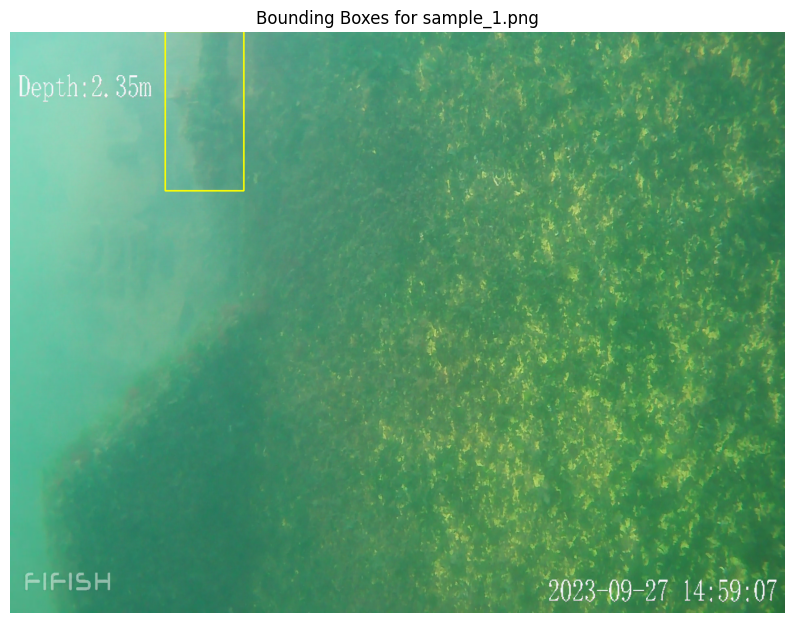

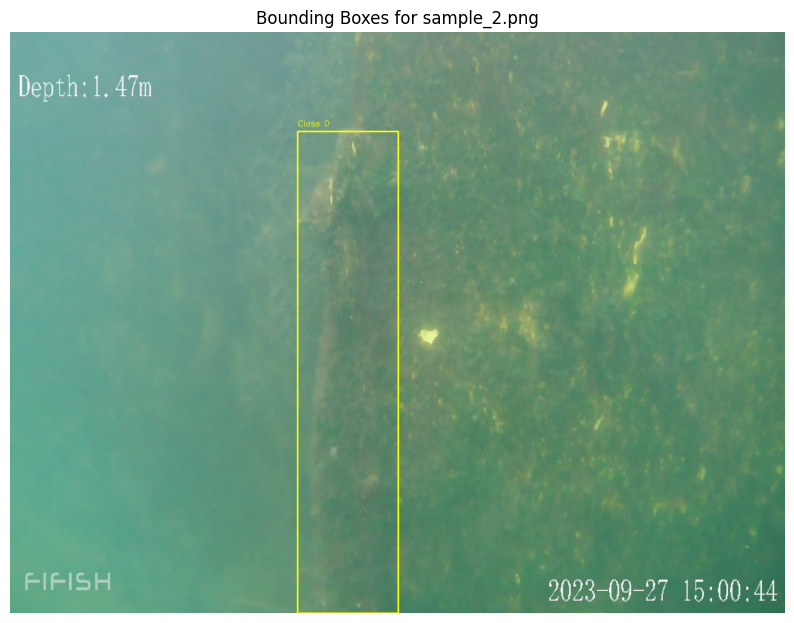

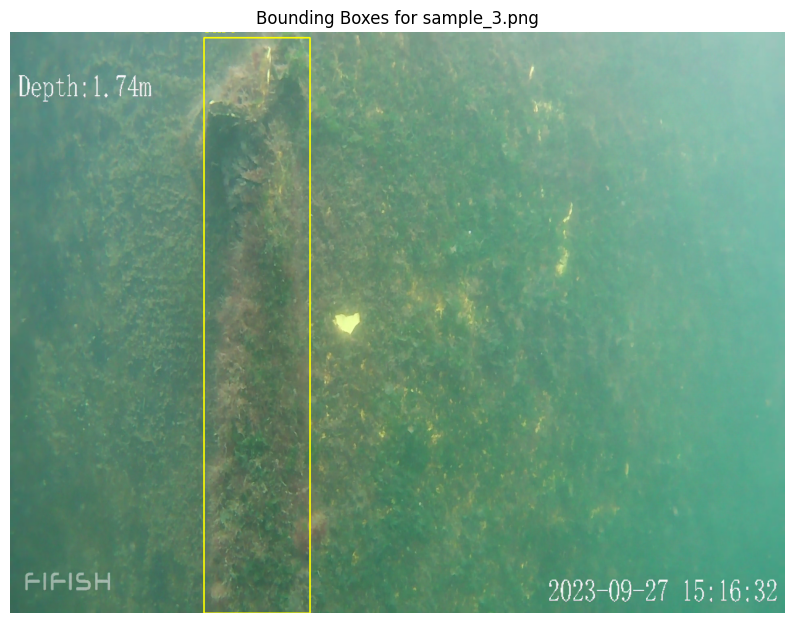

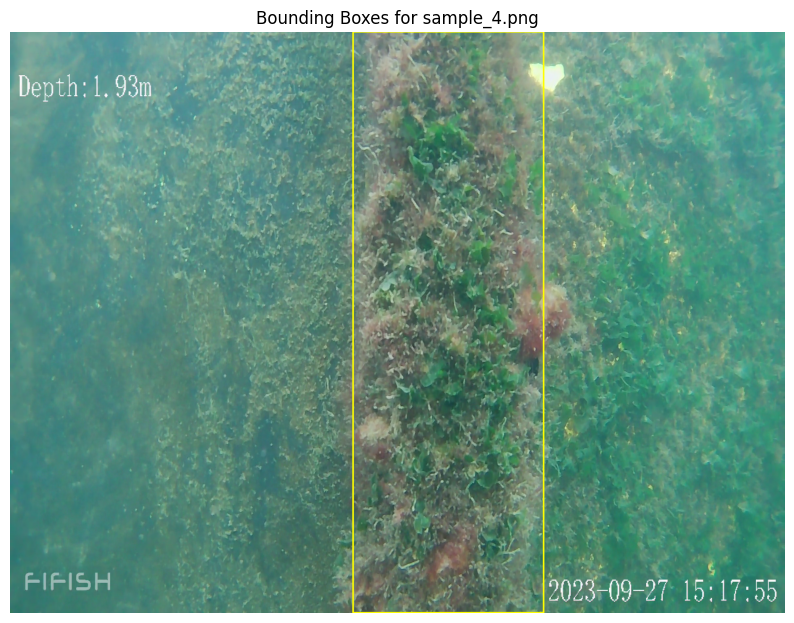

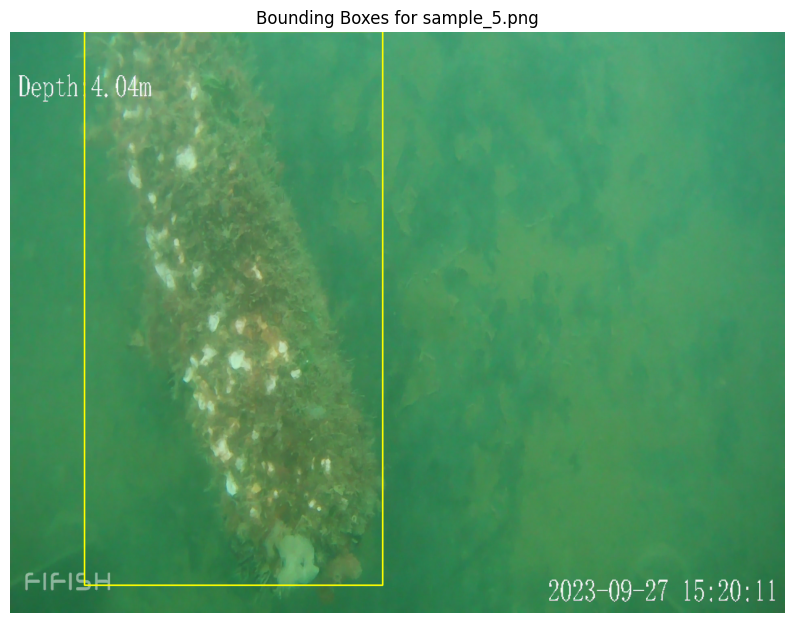

...

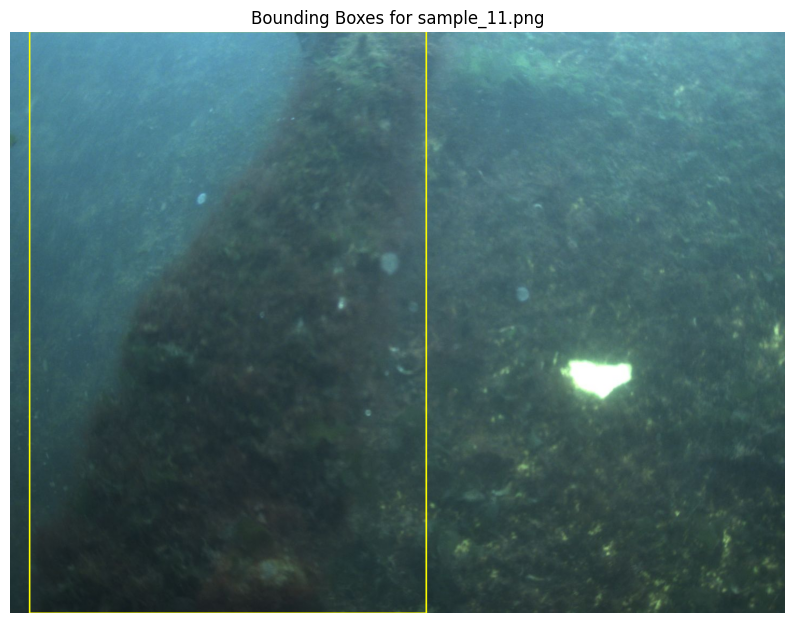

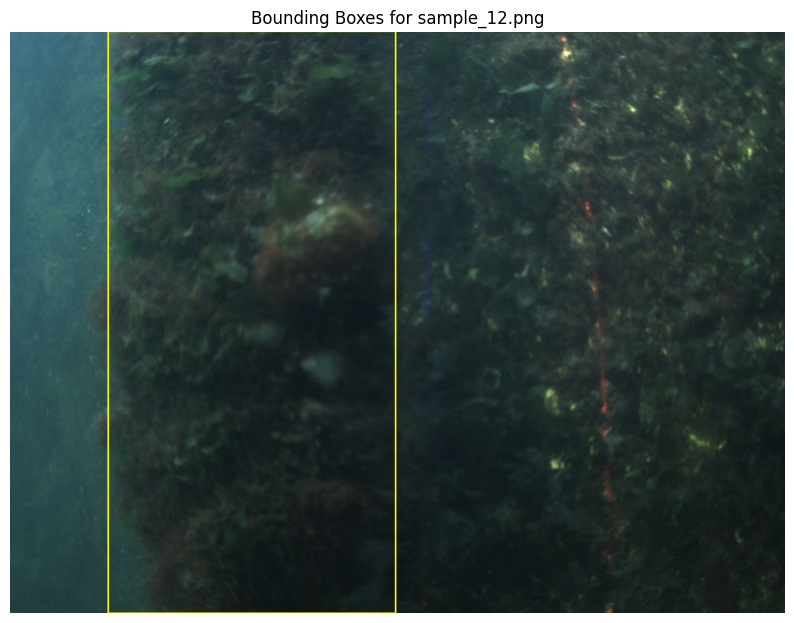

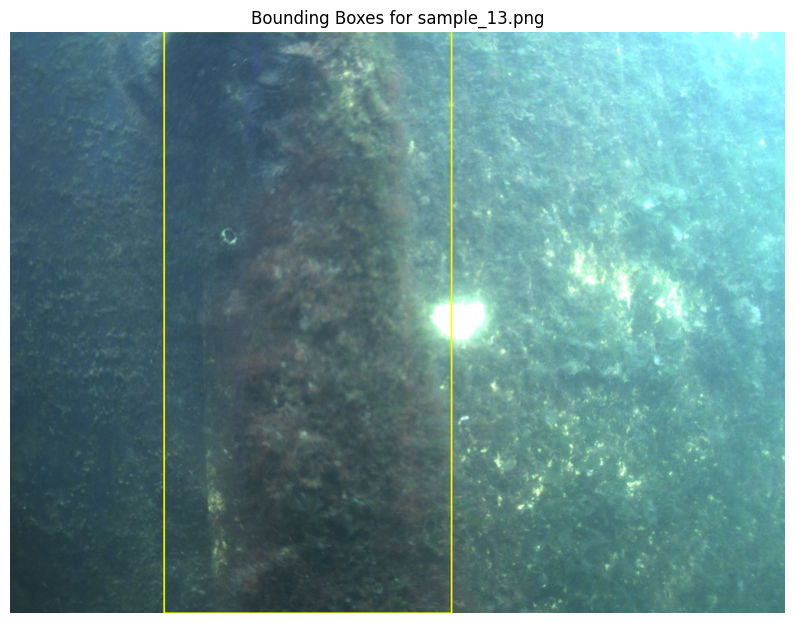

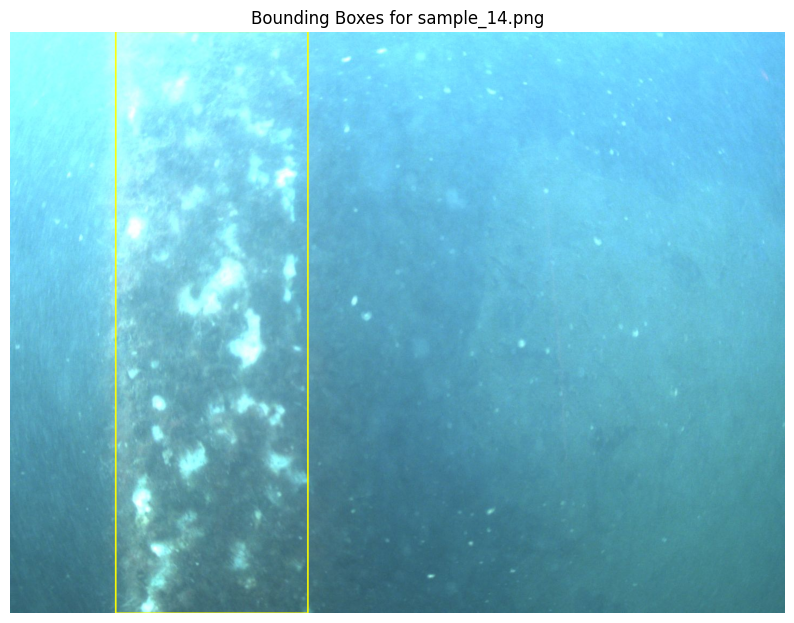

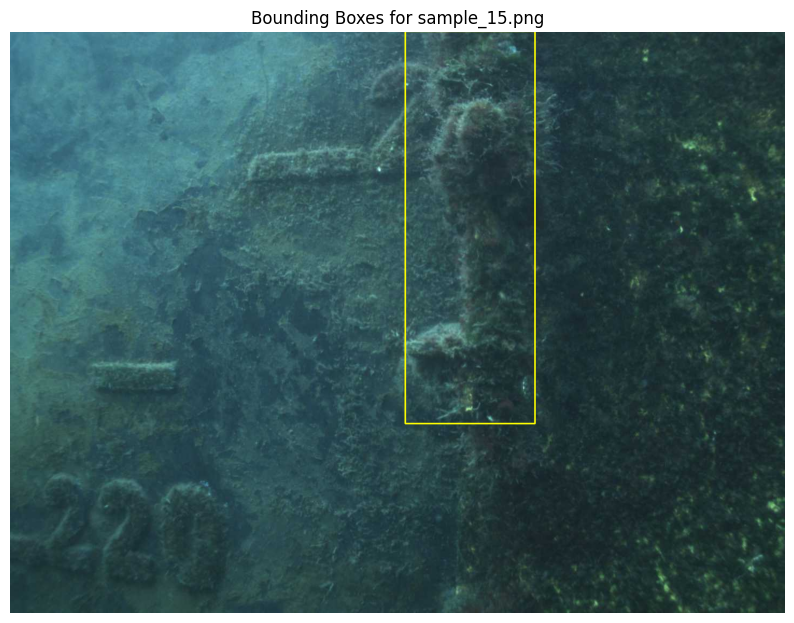

In [39]:
import os
import cv2
import matplotlib.pyplot as plt

# Get the current working directory
folder_path = os.getcwd()

# Specify the path to the Sample folder
sample_folder = os.path.join(folder_path, "dataset/Sample")

# Define the paths for images and labels
image_folder = os.path.join(sample_folder, "images")  # Adjust folder name if different
label_folder = os.path.join(sample_folder, "labels")  # Adjust folder name if different

# Helper function to sort files numerically
def numerical_sort(file_list):
    return sorted(file_list, key=lambda x: int(x.split('_')[-1].split('.')[0]))

# Get sorted lists of image and label files
image_files = numerical_sort([f for f in os.listdir(image_folder) if f.startswith("sample_") and f.endswith(".png")])
label_files = numerical_sort([f for f in os.listdir(label_folder) if f.startswith("sample_") and f.endswith(".txt")])

def xywh_to_xyxy(x, y, w, h):
    # Convert normalized values to pixel values
    x_center, y_center, width, height = x, y, w, h
    img_h, img_w, _ = image.shape
    x_center *= img_w
    y_center *= img_h
    width *= img_w
    height *= img_h

    # Calculate bounding box coordinates
    x_min = int(x_center - width / 2)
    y_min = int(y_center - height / 2)
    x_max = int(x_center + width / 2)
    y_max = int(y_center + height / 2)

    return x_min, y_min, x_max, y_max               

# Iterate through sorted image and label files
for image_file, label_file in zip(image_files, label_files):
    image_path = os.path.join(image_folder, image_file)
    label_path = os.path.join(label_folder, label_file)
    
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image not found: {image_path}")
        continue

    # Read the corresponding label file
    with open(label_path, "r") as file:
        for line in file.readlines():
            values = line.split()
            class_id = int(values[0])  # Classification ID

            x_center, y_center, width, height = map(float, values[1:])
            x_min, y_min, x_max, y_max = xywh_to_xyxy(x_center, y_center, width, height)

            # Draw the bounding box
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 255), 2)  # Bounding box in cyan color
            # Add class label
            cv2.putText(image, f"Class {class_id}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1)

    # Convert the image from BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Display the image
    plt.figure(figsize=(10, 8))
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title(f"Bounding Boxes for {image_file}")
    plt.show()


### Data Augmentation (nao por enquanto)

In [16]:
from torch.utils.data import DataLoader

def get_transforms_no_augmentation():
    return transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

def get_transforms_with_augmentation():
    return transforms.Compose([
        transforms.ToPILImage(),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=15),
        transforms.RandomResizedCrop(size=224, scale=(0.8, 1.0)),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
        transforms.GaussianBlur(kernel_size=(5, 5)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ])

### Create the dataset Class

In [11]:
class Dataset(data.Dataset):
    def __init__(self, image_dir, annotation_dir, img_size):
      	# Specify the folder that contains images in the dataset
        self.image_dir = image_dir
        self.annotation_dir = annotation_dir
        self.img_size = img_size

        # Match images and annotations by filenames
        self.image_files = sorted([f for f in os.listdir(image_dir) if f.endswith((".png"))])
        self.annotation_files = sorted([f for f in os.listdir(annotation_dir) if f.endswith(".txt")])
        assert len(self.image_files) == len(self.annotation_files), "Mismatch in images and annotations count."

    def __len__(self):
        # return the number of total samples contained in the dataset
        return len(self.image_files)

    def __getitem__(self, idx):
        # get the image and label file paths
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        img = cv2.imread(img_path)
        img = cv2.resize(img, (self.img_size, self.img_size))
        img = img / 255.0  # Normalize to [0, 1]
        img = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)

        # Load annotation
        anno_path = os.path.join(self.annotation_dir, self.annotation_files[idx])
        if os.path.exists(anno_path) and os.path.getsize(anno_path) > 0:
            with open(anno_path, "r") as f:
                line = f.readline().strip()
            if line:  # File is not empty and has valid content
                _, x_center, y_center, width, height = map(float, line.split())
                # Scale bbox values to match resized image size
                x_center *= self.img_size
                y_center *= self.img_size
                width *= self.img_size
                height *= self.img_size
                target = torch.tensor([x_center, y_center, width, height, 1.0], dtype=torch.float32)
            else:
                # Print file name
                print(f"Empty annotation file: {anno_path}")
                # Empty file but exists
                target = torch.tensor([0, 0, 0, 0, 0], dtype=torch.float32)
        else:
            # Annotation file missing or empty
            target = torch.tensor([0, 0, 0, 0, 0], dtype=torch.float32)

        return img, target

### Create Custom Model

In [47]:
class CustomModel(nn.Module):
    def __init__(self, num_classes):
        super(CustomModel, self).__init__()
        
        # Convolutional and Pooling Layers
        self.conv_block = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.fc_block = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 28 * 28, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, 5)
        )

    def forward(self, x):
        x = self.conv_block(x)
        x = self.fc_block(x)
        return x

In [ ]:
class CustomModel2(nn.Module):
    def __init__(self, img_size):
        super(CustomModel2, self).__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3_class = nn.Linear(84, 1)  # Output layer for class prediction
        self.fc3_bbox = nn.Linear(84, 4)  # Output layer for bounding box regression

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1)  # Flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        
        class_preds = self.fc3_class(x)  # Class prediction
        bbox_preds = self.fc3_bbox(x)    # Bounding box prediction
        
        return class_preds, bbox_preds

### Loss Function

In [13]:
# Loss Function
def loss_function(predictions, targets):
    pred_boxes = predictions[:, :4]  # x_center, y_center, width, height
    pred_confidence = predictions[:, 4]
    target_boxes = targets[:, :4]
    target_confidence = targets[:, 4]

    bbox_loss = nn.MSELoss()(pred_boxes, target_boxes)
    confidence_loss = nn.BCEWithLogitsLoss()(pred_confidence, target_confidence)
    return bbox_loss + confidence_loss

### IOU

In [52]:
# nn.Module class that will return the IoU for a batch of outputs
class BboxIOU(nn.Module):
    
    def xyhw_to_xyxy(self, bbox):
        """
        Converts from (x_min, y_min, width, height) to (x_min, y_min, x_max, y_max) format
        """
        new_bbox = torch.cat((bbox[:, 0:1], 
                              bbox[:, 1:2],
                              bbox[:, 2:3] + bbox[:, 0:1], 
                              bbox[:, 3:4] + bbox[:, 1:2]), 1)
        return new_bbox

    def bb_intersection_over_union(self, pred_xyhw, target_xyhw):
        pred_xyxy = self.xyhw_to_xyxy(pred_xyhw)
        target_xyxy = self.xyhw_to_xyxy(target_xyhw)

        # Determine the (x, y)-coordinates of the intersection rectangle
        xA = torch.cat((pred_xyxy[:, 0:1], target_xyxy[:, 0:1]), 1).max(dim=1)[0].unsqueeze(1)
        yA = torch.cat((pred_xyxy[:, 1:2], target_xyxy[:, 1:2]), 1).max(dim=1)[0].unsqueeze(1)
        xB = torch.cat((pred_xyxy[:, 2:3], target_xyxy[:, 2:3]), 1).min(dim=1)[0].unsqueeze(1)
        yB = torch.cat((pred_xyxy[:, 3:4], target_xyxy[:, 3:4]), 1).min(dim=1)[0].unsqueeze(1)

        # Compute the area of intersection rectangle
        x_len = F.relu(xB - xA)
        y_len = F.relu(yB - yA)
        # Negative area means no overlap
        interArea = x_len * y_len

        area1 = pred_xyhw[:, 2:3] * pred_xyhw[:, 3:4]
        area2 = target_xyhw[:, 2:3] * target_xyhw[:, 3:4]

        # Compute the intersection over union by taking the intersection
        # area and dividing it by the sum of prediction + ground-truth
        # areas - the interesection area
        iou = interArea / (area1 + area2 - interArea + 1e-5)

        # Return the intersection over union value
        return iou

    def forward(self, predictions, data):
        """
        data: list of data, index 0 is the input image index [0] is the target
        predictions: raw output of the model, the first 4 outputs are assumed to be the bounding box values
        """
        
        pred_bbox = torch.sigmoid(predictions[:, 1:5])
        target_bbox = data[1].to(pred_bbox.device)
        
        return self.bb_intersection_over_union(pred_bbox, target_bbox)

### Train Custom Model

In [53]:
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader

#  Set Paths
train_image_dir = "dataset/pool/train/images"          # Replace with your images directory
train_annotation_dir = "dataset/pool/train/labels"  # Replace with your annotations directory
val_image_dir = "dataset/pool/val/images"
val_annotation_dir = "dataset/pool/val/labels"
img_size = 224  # ResNet requires 224x224 images

# Train Dataset and DataLoader
train_dataset = Dataset(image_dir=train_image_dir, annotation_dir=train_annotation_dir, img_size=img_size)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Validation Dataset and DataLoader
val_dataset = Dataset(image_dir=val_image_dir, annotation_dir=val_annotation_dir, img_size=img_size)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomModel(1)  # Output for bbox (x, y, w, h, class)
model.eval = BboxIOU()  # IoU metric
model = model.to(device)

# Loss and Optimizer
criterion = nn.MSELoss()  # Mean Squared Error for bounding box regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training Loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, targets in train_loader:
        images, targets = images.to(device), targets.to(device)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        
        # Compute loss
        loss = criterion(outputs, targets)
        
        # Backward pass and update weights
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {running_loss / len(train_loader):.4f}")

    # Validation Loop
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, targets in val_loader:
            images, targets = images.to(device), targets.to(device)
            outputs = model(images)
            loss = criterion(outputs, targets)
            val_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Val Loss: {val_loss / len(val_loader):.4f}")

# Save the Model
torch.save(model.state_dict(), "custom.pth")
print("Model saved as custom.pth")

Epoch 1/10, Train Loss: 1172.5832
Epoch 1/10, Val Loss: 252.0179
Epoch 2/10, Train Loss: 559.0327
Epoch 2/10, Val Loss: 167.3206
Epoch 3/10, Train Loss: 562.5505
Epoch 3/10, Val Loss: 239.6342
Epoch 4/10, Train Loss: 511.4872
Epoch 4/10, Val Loss: 177.4999
Epoch 5/10, Train Loss: 478.0838
Epoch 5/10, Val Loss: 130.4596
Epoch 6/10, Train Loss: 462.9560
Epoch 6/10, Val Loss: 197.7671
Epoch 7/10, Train Loss: 449.0612
Epoch 7/10, Val Loss: 102.5437
Epoch 8/10, Train Loss: 477.8797
Epoch 8/10, Val Loss: 79.2879
Epoch 9/10, Train Loss: 421.6188
Epoch 9/10, Val Loss: 82.1470
Epoch 10/10, Train Loss: 411.2229
Epoch 10/10, Val Loss: 112.1534
Model saved as custom.pth


### Test Custom Model

Sample 1
Predicted Bounding Box: [111.06398  111.71324   48.154537 221.8978     1.009978]
Ground Truth: [113.56956  112.        33.503555 224.         1.      ]


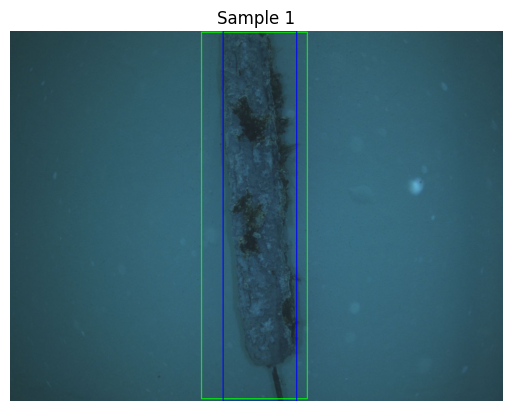

Sample 2
Predicted Bounding Box: [107.644684  110.84071    48.74525   220.07602     1.0000179]
Ground Truth: [110.573555 112.        34.482    224.         1.      ]


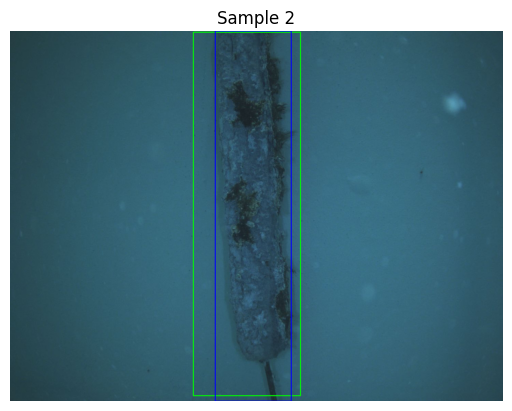

Sample 3
Predicted Bounding Box: [105.716995  110.56883    49.21699   219.70804     0.9970795]
Ground Truth: [108.934    112.        34.810223 224.         1.      ]


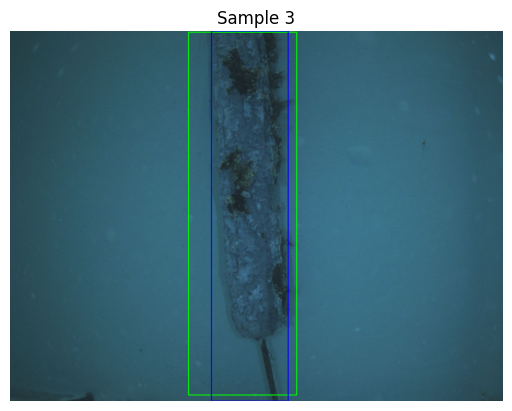

Sample 4
Predicted Bounding Box: [105.27384    99.143005   34.918118  193.38484     0.9013686]
Ground Truth: [108.716225 103.535706  28.776222 207.07141    1.      ]


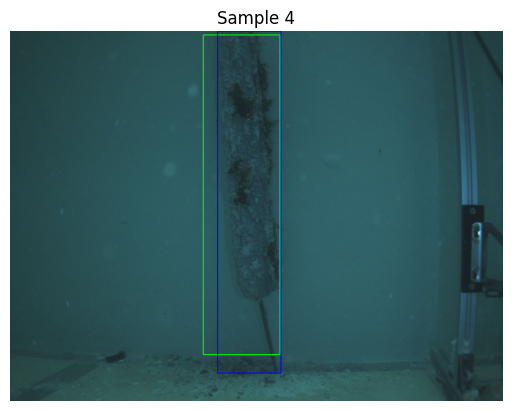

Sample 5
Predicted Bounding Box: [ 98.405014   112.31215     52.137356   222.22586      0.99840057]
Ground Truth: [ 98.14     112.        39.976223 224.         1.      ]


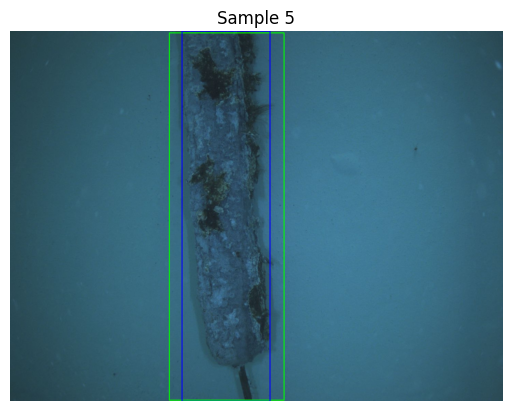

Sample 6
Predicted Bounding Box: [108.7228     100.18492     35.28832    196.19316      0.91102433]
Ground Truth: [113.29578 102.3203   27.482   204.64267   1.     ]


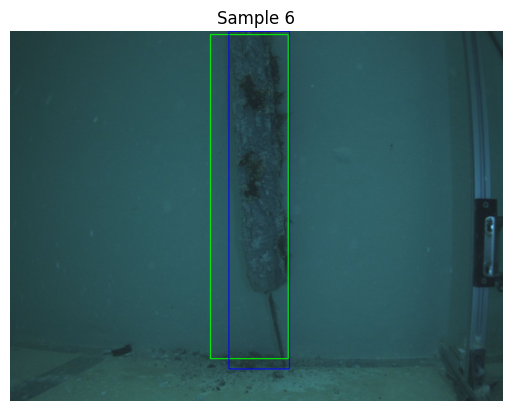

Sample 7
Predicted Bounding Box: [ 76.287315  111.25488    56.78805   217.21143     0.9763988]
Ground Truth: [ 64.29578  112.        48.740223 224.         1.      ]


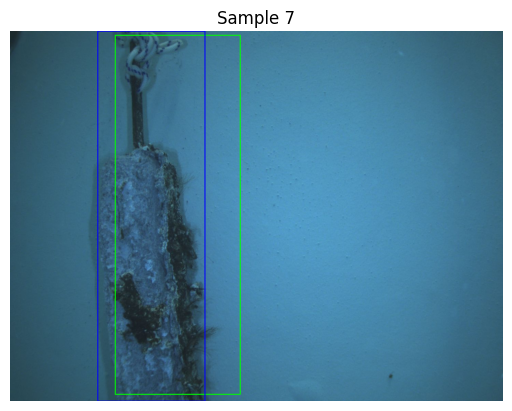

Sample 8
Predicted Bounding Box: [ 72.44039    110.53805     58.156673   216.23956      0.96977097]
Ground Truth: [ 59.370888 112.        51.851334 224.         1.      ]


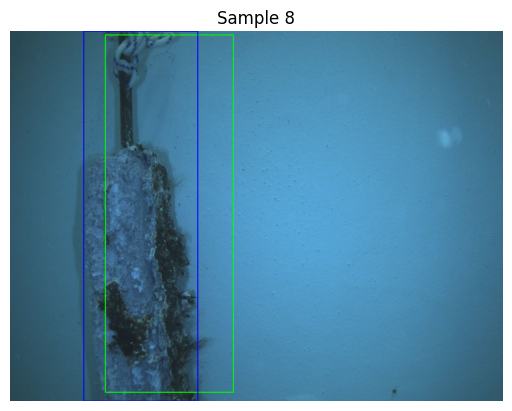

Sample 9
Predicted Bounding Box: [ 70.16827    109.80029     58.739185   215.16371      0.96229815]
Ground Truth: [ 58.288223 112.        52.98689  224.         1.      ]


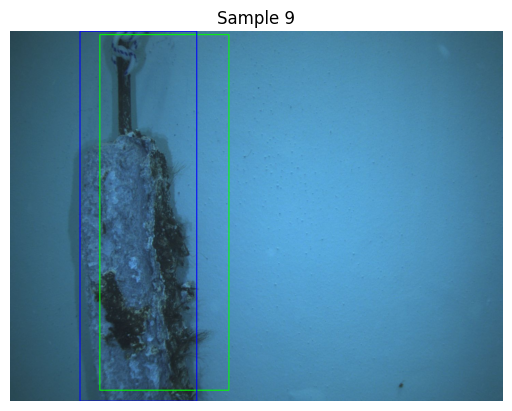

Sample 10
Predicted Bounding Box: [121.10062   102.67856    36.04143   200.83128     0.9307854]
Ground Truth: [126.77778  100.938965  25.406889 201.87585    1.      ]


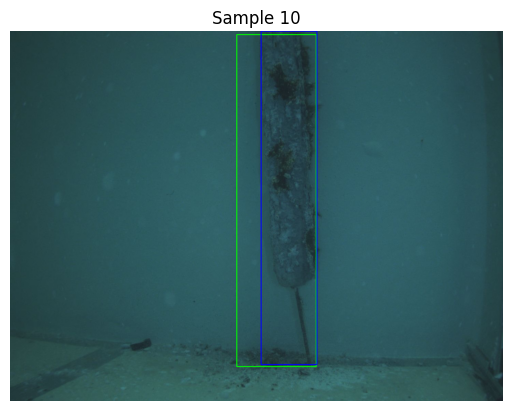

Sample 11
Predicted Bounding Box: [ 79.25731   115.706375   66.619354  230.24844     0.7472799]
Ground Truth: [ 70.234886 112.        59.454887 224.         1.      ]


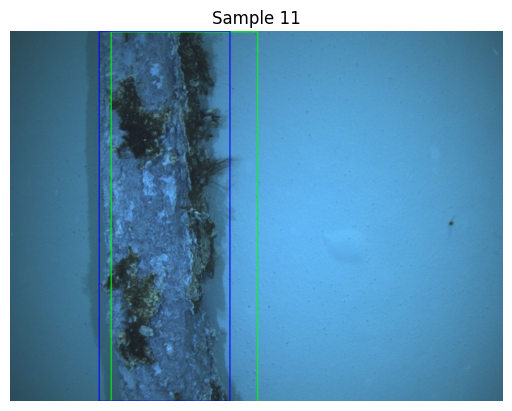

In [54]:
# Test Dataset Paths
test_image_dir = "dataset/pool/test/images"
test_annotation_dir = "dataset/pool/test/labels"
img_size = 224

# Create Test Dataset and DataLoader
test_dataset = Dataset(image_dir=test_image_dir, annotation_dir=test_annotation_dir, img_size=img_size)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Load the Trained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomModel(1)
model.load_state_dict(torch.load("custom.pth", weights_only=True))
model = model.to(device)
model.eval()

# Test the Model
with torch.no_grad():
    for idx, (images, targets) in enumerate(test_loader):
        images = images.to(device)
        targets = targets.to(device)

        # Predictions
        outputs = model(images)

        # Get predicted bounding boxes
        predicted_bbox = outputs[0].cpu().numpy()  # Convert to NumPy
        true_bbox = targets[0].cpu().numpy()

        # Print predictions and ground truth
        print(f"Sample {idx + 1}")
        print(f"Predicted Bounding Box: {predicted_bbox}")
        print(f"Ground Truth: {true_bbox}")

        # Load the original image (to get the original size)
        original_img_path = os.path.join(test_image_dir, test_dataset.image_files[idx])
        original_img = cv2.imread(original_img_path)  # Read the original image
        original_height, original_width = original_img.shape[:2]

        # Resize the predicted bounding box to match the original size
        x, y, w, h = predicted_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw predicted bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for predicted

        # Resize the ground truth bounding box to match the original size
        x, y, w, h = true_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw ground truth bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Blue for ground truth

        # Show image with bounding boxes
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Sample {idx + 1}")
        plt.axis("off")
        plt.show()

        if idx == 10:
            break

In [ ]:
import torch
import torch.nn as nn
from torch.optim import Optimizer
from torch.utils.data import DataLoader


# Function to save the model
def saveModel(model: nn.Module, optimizer: Optimizer, path: str):
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }, path)
    print(f"Model saved at {path}")

def trainModel(model: nn.Module,
               dataloader: DataLoader,
               loss_function: nn.Module,
               optimizer: Optimizer,
               device: torch.device,
               num_epochs: int,
               path_model: str,
               verbatim=True):
    
    model.train()  # Set the model to training mode
    model.to(device)  # Move model to the correct device
    loss_function.to(device)  # Ensure loss function is on the correct device
    
    best_acc = 0.0
    best_loss = float('inf')  # Initialize to a large value
    best_epoch = 0
    
    for epoch in range(num_epochs):
        model.train()  # Ensure the model is in training mode
        train_correct = 0
        train_loss = 0.0
        total_samples = 0
        
        for ibatch, (images, labels, bbox) in enumerate(dataloader, 0):  # Unpack 3 values
            # Move data to device
            images = images.to(device)
            labels = labels.to(device)
            bbox = bbox.to(device)  # Ensure bbox is also on the correct device
            
            # 1. Forward pass
            class_preds, bbox_preds = model(images)  # Model outputs both class and bbox predictions
            
            # 2. Calculate loss
            classification_loss = F.cross_entropy(class_preds, labels)
            bbox_loss = F.smooth_l1_loss(bbox_preds, bbox)
            
            # Combine classification and bbox loss
            loss = classification_loss + bbox_loss
            train_loss += loss.item() * images.size(0)  # Accumulate loss
            
            # 3. Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            # 4. Calculate accuracy
            _, y_pred_class = torch.max(class_preds, dim=1)
            train_correct += (y_pred_class == labels).sum().item()
            total_samples += labels.size(0)
        
        # Calculate average loss and accuracy for the epoch
        avg_loss = train_loss / total_samples
        avg_acc = train_correct / total_samples
        
        # Save the best model based on accuracy
        if avg_acc > best_acc:
            best_acc = avg_acc
            best_loss = avg_loss
            best_epoch = epoch
            saveModel(model, optimizer, path_model)
        
        if verbatim:
            print(f"Epoch {epoch+1}/{num_epochs} | Loss: {avg_loss:.4f} | Accuracy: {avg_acc:.4f}")
    
    print(f"Training completed. Best loss: {best_loss:.4f}, Best accuracy: {best_acc:.4f} at epoch {best_epoch+1}")
    
    return best_loss, best_acc, best_epoch

# Evaluation function (for testing the model)
def evaluateModel(model: nn.Module,
                  dataloader: DataLoader,
                  device: torch.device):
    """
    Evaluates the model on a given dataloader.
    """
    model.eval()  # Set the model to evaluation mode
    model.to(device)
    
    total_correct = 0
    total_samples = 0
    total_loss = 0.0
    with torch.no_grad():  # Disable gradient calculation during evaluation
        for images, labels in dataloader:
            images = images.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model(images)
            loss = F.cross_entropy(outputs, labels)
            
            total_loss += loss.item() * images.size(0)  # Accumulate loss
            _, predicted = torch.max(outputs, 1)
            total_correct += (predicted == labels).sum().item()
            total_samples += labels.size(0)
    
    avg_loss = total_loss / total_samples
    avg_acc = total_correct / total_samples
    
    print(f"Test Loss: {avg_loss:.4f}, Test Accuracy: {avg_acc:.4f}")
    
    return avg_loss, avg_acc

# Load datasets with and without augmentation
train_dataset_no_aug = Dataset()
train_dataset_with_aug = Dataset()
test_dataset = Dataset()  # Test set is not augmented

# Create DataLoaders for each
train_loader_no_aug = DataLoader(train_dataset_no_aug, batch_size=32, shuffle=True)
train_loader_with_aug = DataLoader(train_dataset_with_aug, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Define models, loss function, and optimizer
model_no_aug = CustomModel()
model_with_aug = CustomModel()

loss_function = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model_no_aug.parameters(), lr=0.001)  # Example optimizer (use same for both models)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Train the model without augmentation
loss_no_aug, acc_no_aug, epoch_no_aug = trainModel(
    model=model_no_aug,
    dataloader=train_loader_no_aug,
    loss_function=loss_function,
    optimizer=optimizer,
    device=device,
    num_epochs=20,  # Number of epochs to train
    path_model="model_no_augmentation.pth"  # Path to save the best model
)

# Train the model with augmentation
loss_with_aug, acc_with_aug, epoch_with_aug = trainModel(
    model=model_with_aug,
    dataloader=train_loader_with_aug,
    loss_function=loss_function,
    optimizer=optimizer,
    device=device,
    num_epochs=20,
    path_model="model_with_augmentation.pth"
)

# Test the model without augmentation
test_loss_no_aug, test_acc_no_aug = evaluateModel(model_no_aug, test_loader, device)
print(f"Test Loss (Without Augmentation): {test_loss_no_aug:.4f}, Test Accuracy (Without Augmentation): {test_acc_no_aug:.4f}")

# Test the model with augmentation
test_loss_with_aug, test_acc_with_aug = evaluateModel(model_with_aug, test_loader, device)
print(f"Test Loss (With Augmentation): {test_loss_with_aug:.4f}, Test Accuracy (With Augmentation): {test_acc_with_aug:.4f}")

TypeError: Dataset.__init__() missing 3 required positional arguments: 'image_dir', 'annotation_dir', and 'img_size'

In [ ]:
import torch
import torch.nn as nn
from torch.optim import Optimizer
from torch.utils.data import DataLoader

def saveModel(model: nn.Module, optimizer: Optimizer, path: str):
    torch.save({
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
    }, path)
    print(f"Model saved at {path}")

def trainModel(model: nn.Module,
               dataloader: DataLoader,
               loss_function: nn.Module,
               optimizer: Optimizer,
               device: torch.device,
               num_epochs: int,
               path_model: str,
               verbatim=True):
    
    model.train()  # Set the model to training mode
    model.to(device)  # Move model to the correct device
    loss_function.to(device)  # Ensure loss function is on the correct device
    
    best_acc = 0.0
    best_loss = float('inf')  # Initialize to a large value
    best_epoch = 0
    
    for epoch in range(num_epochs):
        model.train()  # Ensure the model is in training mode
        train_correct = 0
        train_loss = 0.0
        total_samples = 0
        
        for ibatch, (images, labels) in enumerate(dataloader, 0):
            # Move data to device
            images = images.to(device)
            labels = labels.to(device)
            
            # 1. Forward pass
            outputs = model(images)
            
            # 2. Calculate loss
            loss = loss_function(outputs, labels)
            train_loss += loss.item() * images.size(0)  # Accumulate loss
            
            # 3. Backward pass and optimization
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            # 4. Calculate accuracy
            _, y_pred_class = torch.max(outputs, dim=1)
            train_correct += (y_pred_class == labels).sum().item()
            total_samples += labels.size(0)
        
        # Calculate average loss and accuracy for the epoch
        avg_loss = train_loss / total_samples
        avg_acc = train_correct / total_samples
        
        # Save the best model based on accuracy
        if avg_acc > best_acc:
            best_acc = avg_acc
            best_loss = avg_loss
            best_epoch = epoch
            saveModel(model, optimizer, path_model)
        
        if verbatim:
            print(f"Epoch {epoch+1}/{num_epochs} | Loss: {avg_loss:.4f} | Accuracy: {avg_acc:.4f}")
    
    print(f"Training completed. Best loss: {best_loss:.4f}, Best accuracy: {best_acc:.4f} at epoch {best_epoch+1}")
    
    return best_loss, best_acc, best_epoch


In [181]:
def calculate_iou(pred, ground_truth):
  # coordinates of the area of intersection.
  x1_i = np.maximum(ground_truth[0], pred[0])
  y1_i = np.maximum(ground_truth[1], pred[1])
  x2_i = np.minimum(ground_truth[2], pred[2])
  y2_i = np.minimum(ground_truth[3], pred[3])

  # Intersection height and width.
  intersection_height = np.maximum(y2_i - y1_i + 1, np.array(0.))
  intersection_width = np.maximum(x2_i - x1_i + 1, np.array(0.))

  area_of_intersection = intersection_height * intersection_width

  # Ground Truth dimensions.
  gt_height = ground_truth[3] - ground_truth[1] + 1
  gt_width = ground_truth[2] - ground_truth[0] + 1

  # Prediction dimensions.
  pd_height = pred[3] - pred[1] + 1
  pd_width = pred[2] - pred[0] + 1

  area_of_union = gt_height * gt_width + pd_height * pd_width - area_of_intersection

  # Avoid division by zero
  if area_of_union == 0:
    area_of_union = 1e-6
    print(f"WARNING: Area_of_union = 0!")

  iou = area_of_intersection / area_of_union

  return iou

def calculate_evaluation_metrics(output, label): # precision, recall, iou
    TP = 0
    FP = 0
    FN = 0

    intersection_over_union = 0
    area_pred = 0
    area_ground_truth = 0

    pred = xywh_to_xyxy(output)
    ground_truth = xywh_to_xyxy(label)

    intersection_over_union = calculate_iou(pred, ground_truth)
    area_pred = (pred[2] - pred[0]) * (pred[3] - pred[1])
    area_ground_truth = (ground_truth[2] - ground_truth[0]) * (ground_truth[3] - ground_truth[1])

    TP = intersection_over_union * area_pred
    FP = area_pred - TP
    FN = area_ground_truth - TP

    precision = TP / (TP + FP) # TruePositive / AllObservations
    recall = TP / (TP + FN) # TruePositive / AllGroundTruth

    return precision, recall, intersection_over_union

### RESNET EXAMPLE

In [55]:
from torchvision.models import resnet50,ResNet50_Weights
from torch.utils.data import DataLoader
from torch import optim

#  Set Paths
train_image_dir = "dataset/pool/train/images"          # Replace with your images directory
train_annotation_dir = "dataset/pool/train/labels"  # Replace with your annotations directory
val_image_dir = "dataset/pool/val/images"
val_annotation_dir = "dataset/pool/val/labels"
img_size = 224  # ResNet requires 224x224 images

# Train Dataset and DataLoader
train_dataset = Dataset(image_dir=train_image_dir, annotation_dir=train_annotation_dir, img_size=img_size)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Validation Dataset and DataLoader
val_dataset = Dataset(image_dir=val_image_dir, annotation_dir=val_annotation_dir, img_size=img_size)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(model.fc.in_features, 5)  # Output for bbox (x, y, w, h, class)
model = model.to(device)

# Loss and Optimizer
criterion = nn.MSELoss()  # Mean Squared Error for bounding box regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training Loop
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, targets in train_loader:
        images, targets = images.to(device), targets.to(device)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        
        # Compute loss
        loss = criterion(outputs, targets)
        
        # Backward pass and update weights
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {running_loss / len(train_loader):.4f}")

    # Validation Loop
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, targets in val_loader:
            images, targets = images.to(device), targets.to(device)
            outputs = model(images)
            loss = criterion(outputs, targets)
            val_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Val Loss: {val_loss / len(val_loader):.4f}")

# Save the Model
torch.save(model.state_dict(), "resnet50_bounding_box.pth")
print("Model saved as resnet50_bounding_box.pth")

Epoch 1/10, Train Loss: 5359.8932
Epoch 1/10, Val Loss: 486.4023
Epoch 2/10, Train Loss: 218.8410
Epoch 2/10, Val Loss: 256.7776
Epoch 3/10, Train Loss: 122.1416
Epoch 3/10, Val Loss: 76.2001
Epoch 4/10, Train Loss: 87.4135
Epoch 4/10, Val Loss: 391.8321
Epoch 5/10, Train Loss: 66.6143
Epoch 5/10, Val Loss: 40.1561
Epoch 6/10, Train Loss: 50.4450
Epoch 6/10, Val Loss: 15.8798
Epoch 7/10, Train Loss: 57.8161
Epoch 7/10, Val Loss: 31.5520
Epoch 8/10, Train Loss: 49.6320
Epoch 8/10, Val Loss: 23.5279
Epoch 9/10, Train Loss: 50.1805
Epoch 9/10, Val Loss: 11.3963
Epoch 10/10, Train Loss: 43.0767
Epoch 10/10, Val Loss: 15.5632
Model saved as resnet50_bounding_box.pth


Sample 1
Predicted Bounding Box: [112.87449    110.648       30.760319   223.9488       0.90934396]
Ground Truth: [113.56956  112.        33.503555 224.         1.      ]


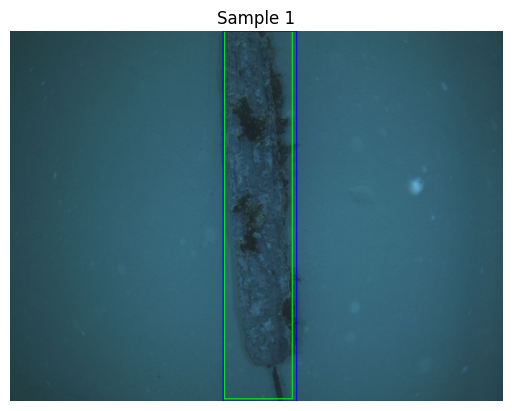

Sample 2
Predicted Bounding Box: [109.75888    110.60183     32.210133   224.59167      0.91313547]
Ground Truth: [110.573555 112.        34.482    224.         1.      ]


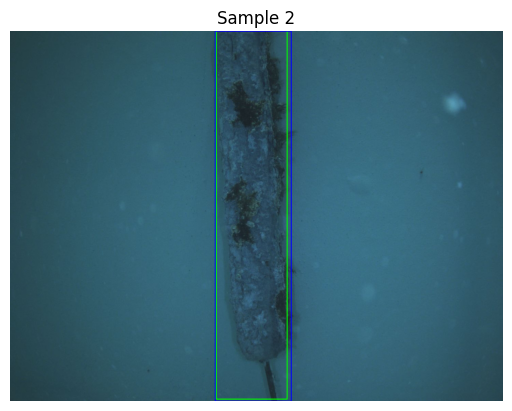

Sample 3
Predicted Bounding Box: [108.27267   110.80283    32.1964    224.88019     0.9154557]
Ground Truth: [108.934    112.        34.810223 224.         1.      ]


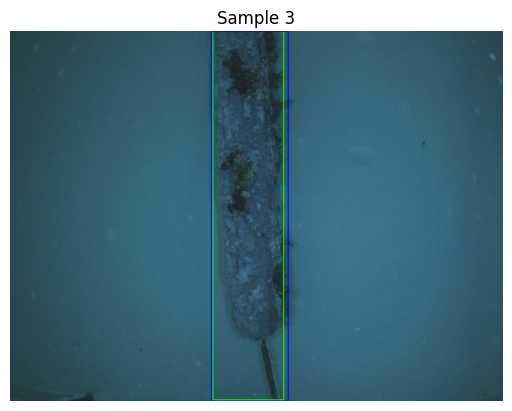

Sample 4
Predicted Bounding Box: [110.0977    103.87009    23.698957  209.89267     0.8928666]
Ground Truth: [108.716225 103.535706  28.776222 207.07141    1.      ]


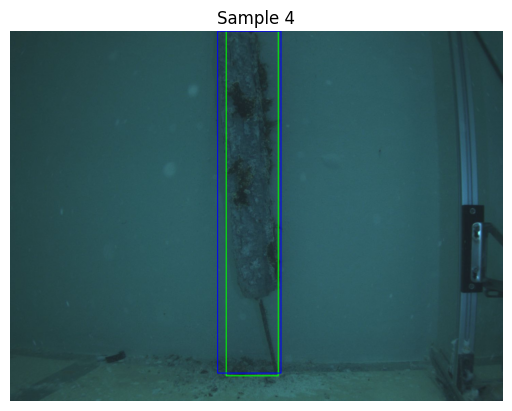

Sample 5
Predicted Bounding Box: [ 98.44657    111.680504    36.18966    227.64603      0.93078005]
Ground Truth: [ 98.14     112.        39.976223 224.         1.      ]


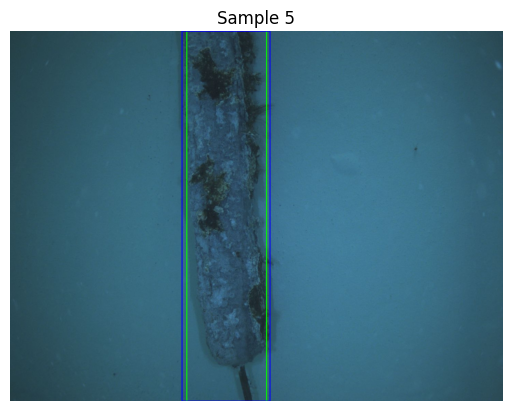

Sample 6
Predicted Bounding Box: [114.692024   103.19327     22.6562     207.2121       0.88440895]
Ground Truth: [113.29578 102.3203   27.482   204.64267   1.     ]


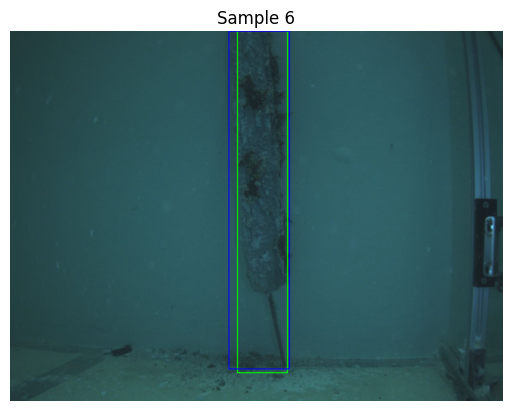

Sample 7
Predicted Bounding Box: [ 61.954132  119.00013    41.65002   219.31902     0.9313491]
Ground Truth: [ 64.29578  112.        48.740223 224.         1.      ]


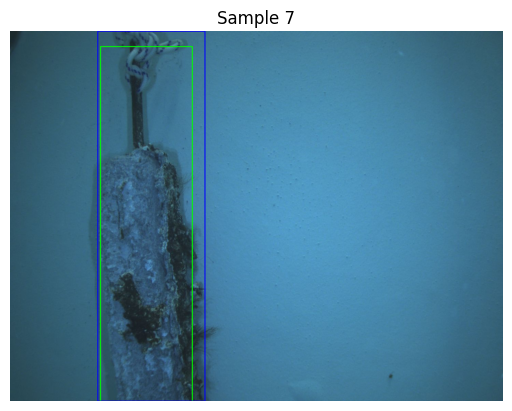

Sample 8
Predicted Bounding Box: [ 56.829403  118.25727    42.767094  219.38344     0.9386668]
Ground Truth: [ 59.370888 112.        51.851334 224.         1.      ]


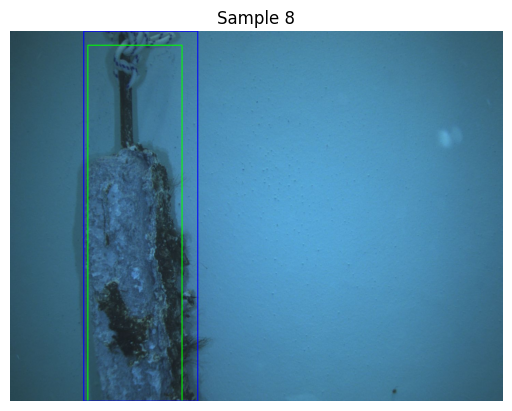

Sample 9
Predicted Bounding Box: [ 55.944263   116.75434     46.413048   222.5797       0.94023323]
Ground Truth: [ 58.288223 112.        52.98689  224.         1.      ]


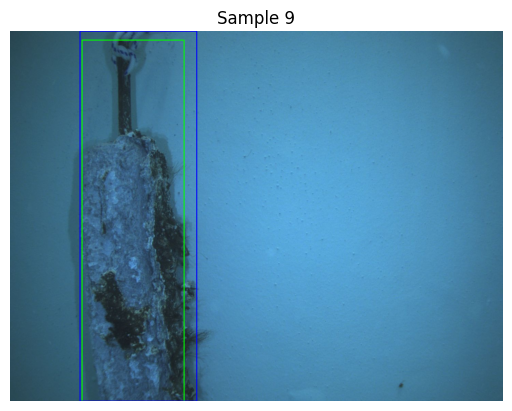

Sample 10
Predicted Bounding Box: [126.59605   101.95293    22.506517  206.09467     0.8872713]
Ground Truth: [126.77778  100.938965  25.406889 201.87585    1.      ]


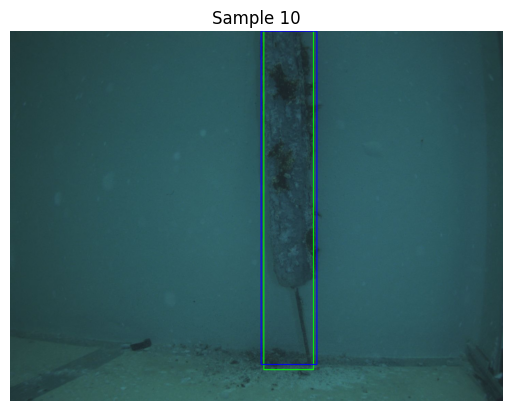

Sample 11
Predicted Bounding Box: [ 66.54989   110.4049     55.054623  230.5334      0.9363525]
Ground Truth: [ 70.234886 112.        59.454887 224.         1.      ]


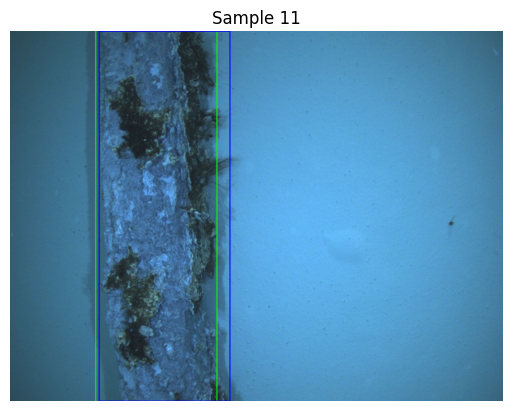

In [56]:
# Test Dataset Paths
test_image_dir = "dataset/pool/test/images"
test_annotation_dir = "dataset/pool/test/labels"
img_size = 224

# Create Test Dataset and DataLoader
test_dataset = Dataset(image_dir=test_image_dir, annotation_dir=test_annotation_dir, img_size=img_size)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Load the Trained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = resnet50(weights=None)  # Initialize model
model.fc = torch.nn.Linear(model.fc.in_features, 5)  # Adjust output layer
model.load_state_dict(torch.load("resnet50_bounding_box.pth", weights_only=True))
model = model.to(device)
model.eval()

# Test the Model
with torch.no_grad():
    for idx, (images, targets) in enumerate(test_loader):
        images = images.to(device)
        targets = targets.to(device)

        # Predictions
        outputs = model(images)

        # Get predicted bounding boxes
        predicted_bbox = outputs[0].cpu().numpy()  # Convert to NumPy
        true_bbox = targets[0].cpu().numpy()

        # Print predictions and ground truth
        print(f"Sample {idx + 1}")
        print(f"Predicted Bounding Box: {predicted_bbox}")
        print(f"Ground Truth: {true_bbox}")

        # Load the original image (to get the original size)
        original_img_path = os.path.join(test_image_dir, test_dataset.image_files[idx])
        original_img = cv2.imread(original_img_path)  # Read the original image
        original_height, original_width = original_img.shape[:2]

        # Resize the predicted bounding box to match the original size
        x, y, w, h = predicted_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw predicted bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for predicted

        # Resize the ground truth bounding box to match the original size
        x, y, w, h = true_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw ground truth bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Blue for ground truth

        # Show image with bounding boxes
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Sample {idx + 1}")
        plt.axis("off")
        plt.show()

        if idx == 10:
            break